In [1]:
# Import necessary libraries
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt




In [2]:
# Get all classes from data
ROOT = 'data'
CLASS_NAMES = sorted(list(os.listdir(f"{ROOT}/train")))
print(CLASS_NAMES)

['African_crocodile', 'American_egret', 'Doberman', 'Lakeland_terrier', 'Orange_easy', 'Rhodesian_ridgeback', 'ambulance', 'apiary', 'bannister', 'barn_spider', 'basketball', 'black_widow', 'brain_coral', 'bullet_train', 'can_opener', 'capuchin', 'car_mirror', 'carousel', 'castle', 'china_cabinet', 'cliff_dwelling', 'comic_book', 'conch', 'cornet', 'dugong', 'electric_locomotive', 'flamingo', 'flatworm', 'goldfish', 'grocery_store', 'guillotine', 'half_track', 'hen-of-the-woods', 'horizontal_bar', 'killer_whale', 'kit_fox', 'knee_pad', 'lion', 'loudspeaker', 'lynx', 'magpie', 'meat_loaf', 'mixing_bowl', 'parachute', 'pizza', 'ram', 'red-backed_sandpiper', 'ruffed_grouse', 'safety_pin', 'scabbard', 'screen', 'steam_locomotive', 'steel_arch_bridge', 'theater_curtain', 'traffic_light', 'triceratops', 'vine_snake', 'warplane', 'white_stork', 'yawl']


In [3]:
def read_image_from_path(path, size):
    img = Image.open(path).convert('RGB').resize(size)

    return np.array(img)

# Test 1 image
path = 'data/test/ambulance/n02701002_2311.JPEG'
size = (600, 600)

print(read_image_from_path(path, size))

[[[249 248 253]
  [247 246 252]
  [244 244 250]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[248 247 252]
  [247 246 251]
  [244 244 249]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[248 246 251]
  [247 245 250]
  [245 243 248]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[105  95  86]
  [103  94  88]
  [105  99  95]
  ...
  [139 136 124]
  [129 127 115]
  [122 120 108]]

 [[107  94  87]
  [102  94  88]
  [102  99  94]
  ...
  [131 125 114]
  [125 121 110]
  [125 120 109]]

 [[109  94  89]
  [102  94  89]
  [ 99  99  93]
  ...
  [124 116 106]
  [123 115 105]
  [127 120 110]]]


In [4]:
def folder_to_images(folder, size):
    list_dir = [folder + '/' + name for name in os.listdir(folder)]
    # display(list_dir)
    images_np = np.zeros(shape=(len(list_dir), *size, 3)) # placeholders for all images in the folder
    images_path = []

    for i, path in enumerate(list_dir):
        images_np[i] = read_image_from_path(path, size)
        images_path.append(path)

    images_path = np.array(images_path)

    return images_np, images_path

# Test folder

folder = 'data/train/ambulance'

stacked_images, images_path = folder_to_images(folder, size)
print(stacked_images.shape)

(10, 600, 600, 3)


In [5]:
# Function to compute absolute difference
def absolute_difference(query, data):
    axis_batch_size = tuple(range(1, len(data.shape)))
    
    return np.sum(np.abs(data - query), axis=axis_batch_size)


# Tests
test_img_path = 'data/train/ambulance/n02701002_11033.JPEG'
query = read_image_from_path(test_img_path, size)
data = stacked_images
print(query.shape)
print(data.shape)
print(absolute_difference(query, data))

(600, 600, 3)
(10, 600, 600, 3)
[0.00000000e+00 9.14293510e+07 1.05662724e+08 1.01267921e+08
 7.30595380e+07 8.20895250e+07 7.51138710e+07 8.66481110e+07
 8.95437570e+07 8.57330940e+07]


# Using L1 Score

In [6]:
def get_l1_score(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    ls_path_score = []

    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAMES:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(path, size) # numpy array with all images in that folder

            rates = absolute_difference(query, images_np)
            
            ls_path_score.extend(list(zip(images_path, rates)))
    
    return query, ls_path_score






In [7]:
# Run tests
# Test
root_img_path = 'data/train/'
query_img_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_l1_score(root_img_path, query_img_path, size)





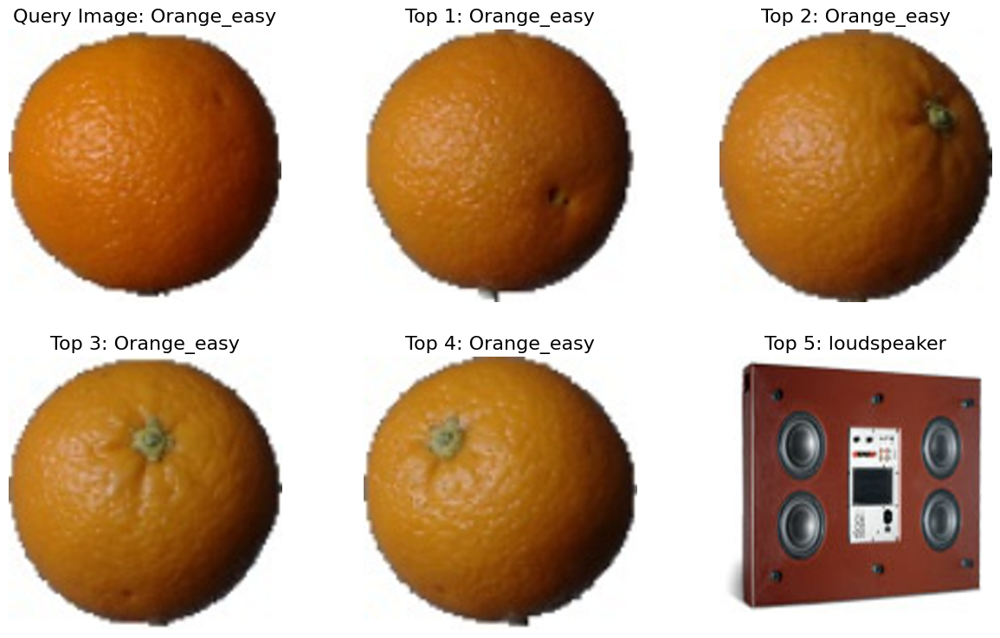

In [8]:
def plot_results(query_img_path, ls_path_score, reverse):
    fig = plt.figure(figsize=(15, 9))
    fig.add_subplot(2, 3, 1)
    plt.imshow(read_image_from_path(query_img_path, size=(448,448)))
    plt.title(f"Query Image: {query_img_path.split('/')[2]}", fontsize=16)
    plt.axis("off")
    for i, path in enumerate(sorted(ls_path_score, key=lambda x : x[1], reverse=reverse)[:5], 2):
        fig.add_subplot(2, 3, i)
        plt.imshow(read_image_from_path(path[0], size=(448,448)))
        plt.title(f"Top {i-1}: {path[0].split('/')[2]}", fontsize=16)
        plt.axis("off")
    plt.show()


plot_results(query_img_path, ls_path_score, reverse=False)



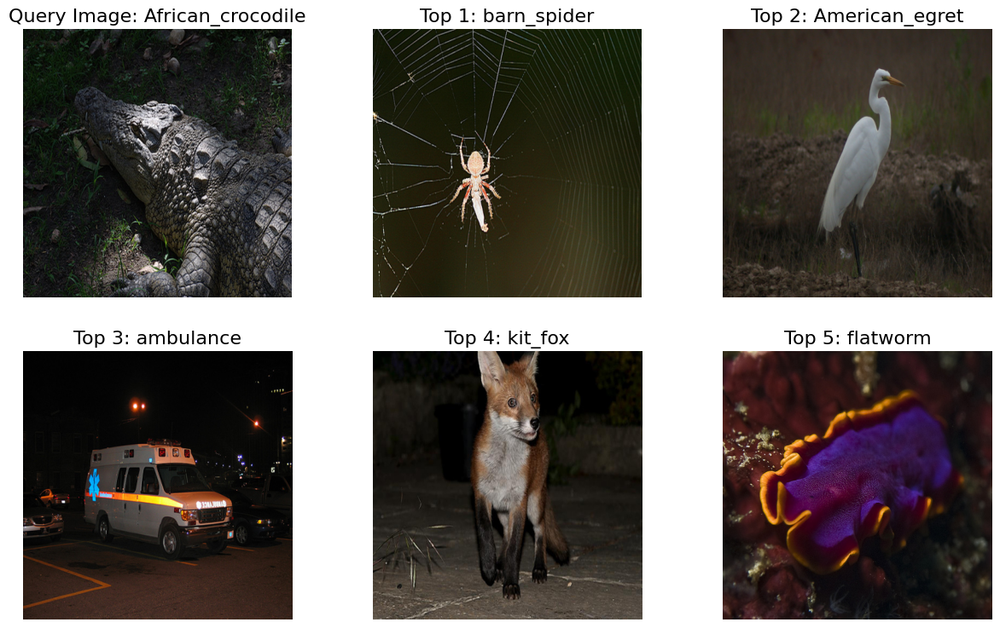

In [9]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)

query, ls_path_score = get_l1_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=False)

# Using L2 Score

In [10]:
def mean_square_difference(query, data):
    axis_batch_size = tuple(range(1, len(data.shape)))
    return np.mean((data - query)**2, axis = axis_batch_size)



In [11]:
def get_l2_score(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    ls_path_score = []

    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAMES:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(path, size)
            rates = mean_square_difference(query, images_np)
            ls_path_score.extend(list(zip(images_path, rates)))

    return query, ls_path_score



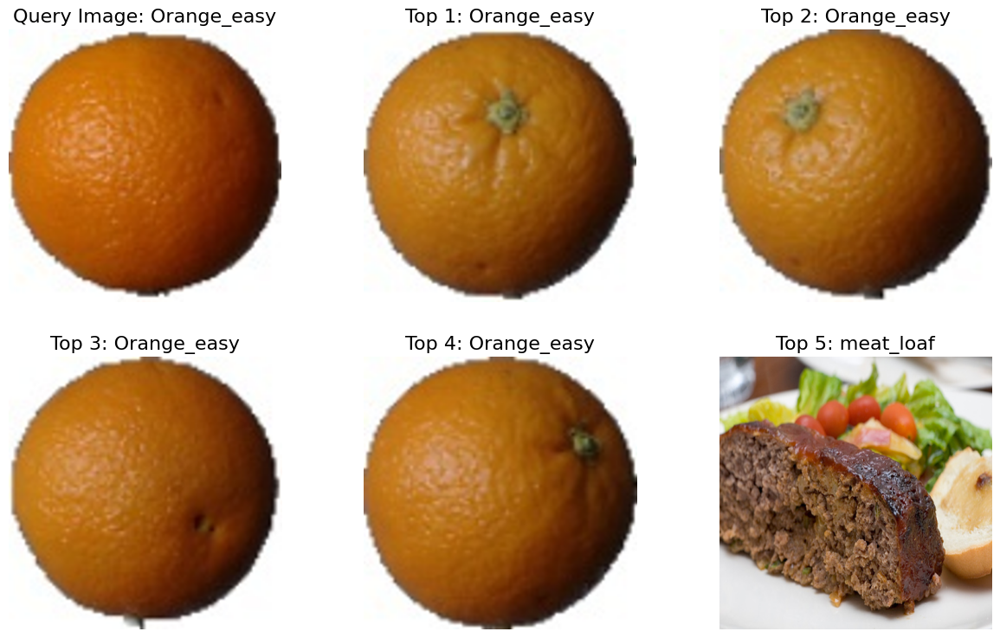

In [12]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_l2_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=False)

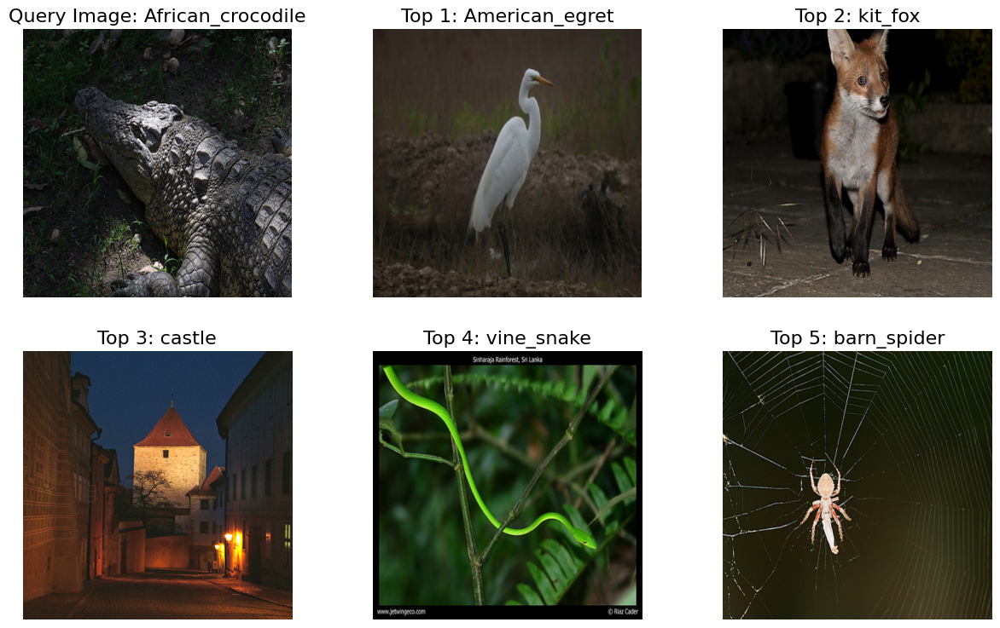

In [13]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_l2_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=False)

# Using cosine similarity

In [38]:
def cosine_similarity(query, data):
    axis_batch_size = tuple(range(1, len(data.shape)))
    query_norm = np.sqrt(np.sum(query**2))
    data_norm = np.sqrt(np.sum(data**2, axis=axis_batch_size))

    return np.sum(data*query, axis=axis_batch_size) / (query_norm*data_norm + np.finfo(float).eps)




In [15]:
def get_cosine_simmilarity_score(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    ls_path_score = []

    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAMES:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(path, size)
            rates = cosine_similarity(query, images_np)
            ls_path_score.extend(list(zip(images_path, rates)))

    return query, ls_path_score




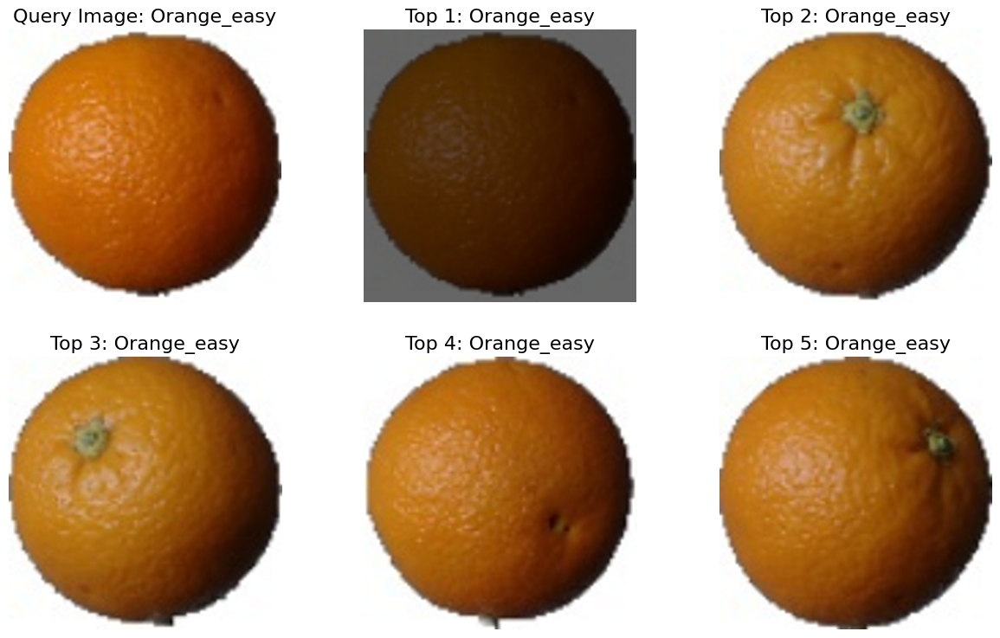

In [16]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)

query, ls_path_score = get_cosine_simmilarity_score(root_img_path, query_path, size)

plot_results(query_path, ls_path_score, reverse=True)

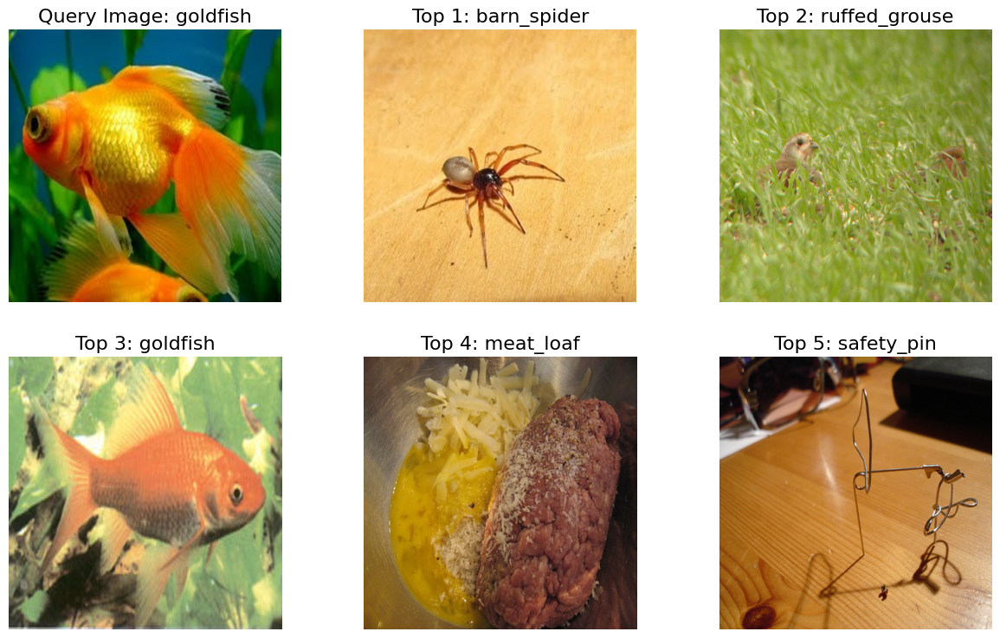

In [17]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/goldfish/n01443537_3883.JPEG"
# query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_cosine_simmilarity_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

# Using Correlation Coefficient

In [18]:
def correlation_coefficient(query, data):
    axis_batch_size = tuple(range(1, len(data.shape)))
    query_mean = query - np.mean(query)
    data_mean = data - np.mean(data, axis=axis_batch_size, keepdims=True)
    query_norm = np.sqrt(np.sum(query_mean**2))
    data_norm = np.sqrt(np.sum(data_mean**2, axis=axis_batch_size))

    return np.sum(data_mean*query_mean, axis=axis_batch_size) / \
        (query_norm*data_norm + np.finfo(float).eps)


In [19]:
def get_correlation_coefficient_score(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    ls_path_score = []

    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAMES:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(path, size)
            rates = correlation_coefficient(query, images_np)
            ls_path_score.extend(list(zip(images_path, rates)))

    return query, ls_path_score


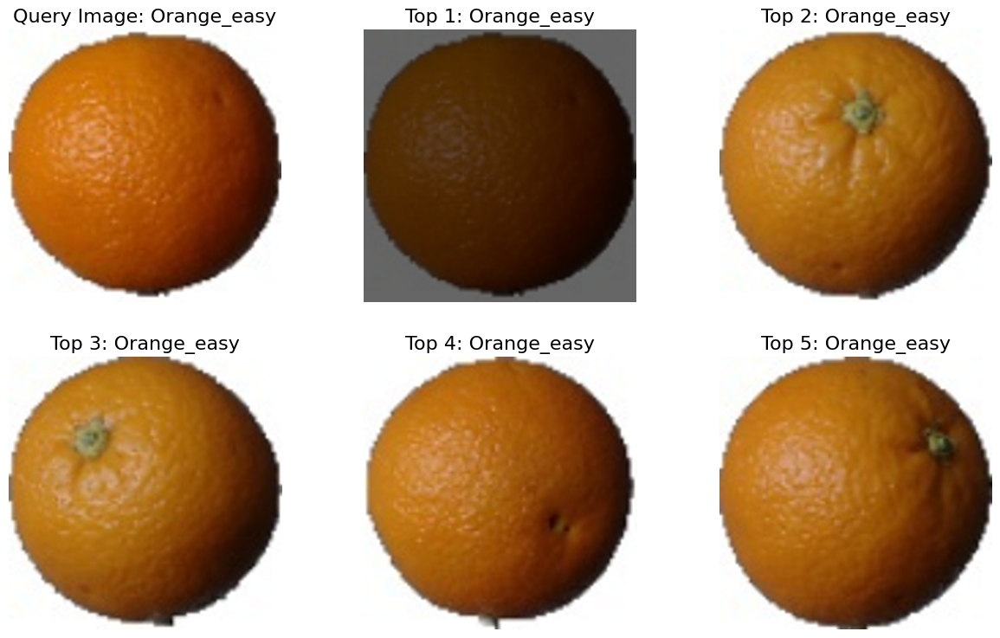

In [20]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_correlation_coefficient_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

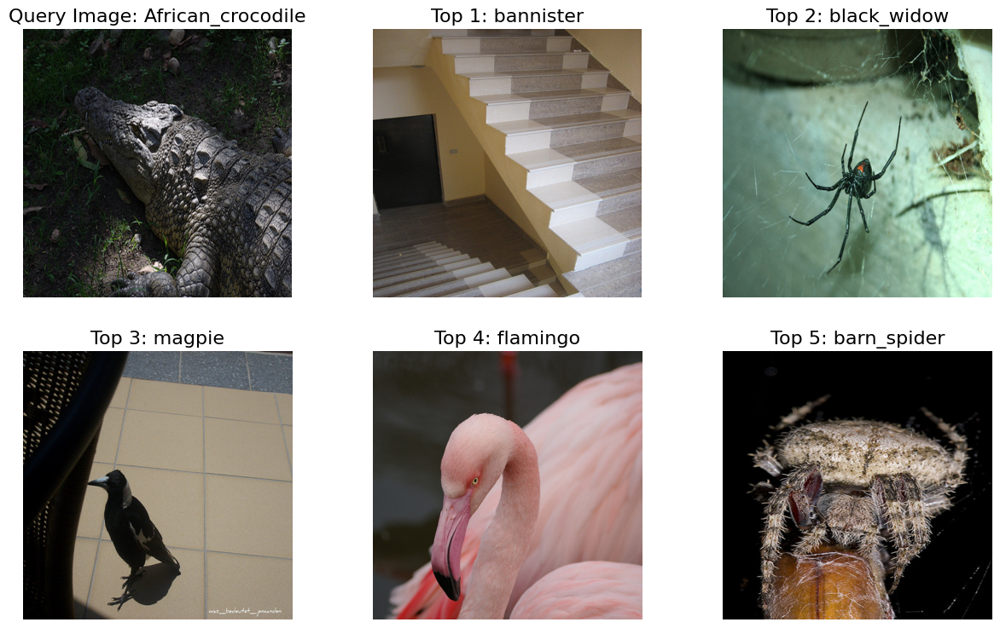

In [21]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_correlation_coefficient_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

# Improve Image Retrieval System using Deep Learning Model - CLIP

In [22]:
!pip install chromadb



[notice] A new release of pip is available: 24.1.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [23]:
!pip install open-clip-torch


[notice] A new release of pip is available: 24.1.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [24]:
# Import libs
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from chromadb.utils.embedding_functions import OpenCLIPEmbeddingFunction


In [25]:
embedding_function = OpenCLIPEmbeddingFunction()

def get_single_image_embedding(image):
    embedding = embedding_function._encode_image(image=np.array(image))

    return embedding




In [26]:
def get_l1_score_clip(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    query_embedding = get_single_image_embedding(query)
    ls_path_score = []

    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAMES:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(path, size)
            embedding_list = []
            for idx_img in range(images_np.shape[0]):
                embedding = get_single_image_embedding(images_np[idx_img].astype(np.uint8))
                embedding_list.append(embedding)

            rates = absolute_difference(query_embedding, np.stack(embedding_list))
            ls_path_score.extend(list(zip(images_path, rates)))

    return query, ls_path_score

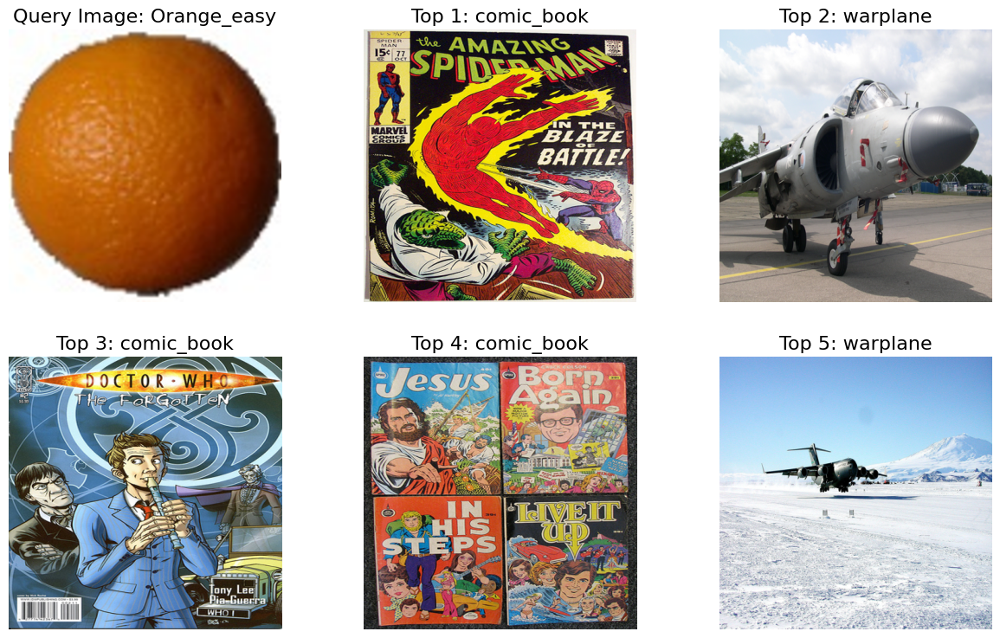

In [27]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_l1_score_clip(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

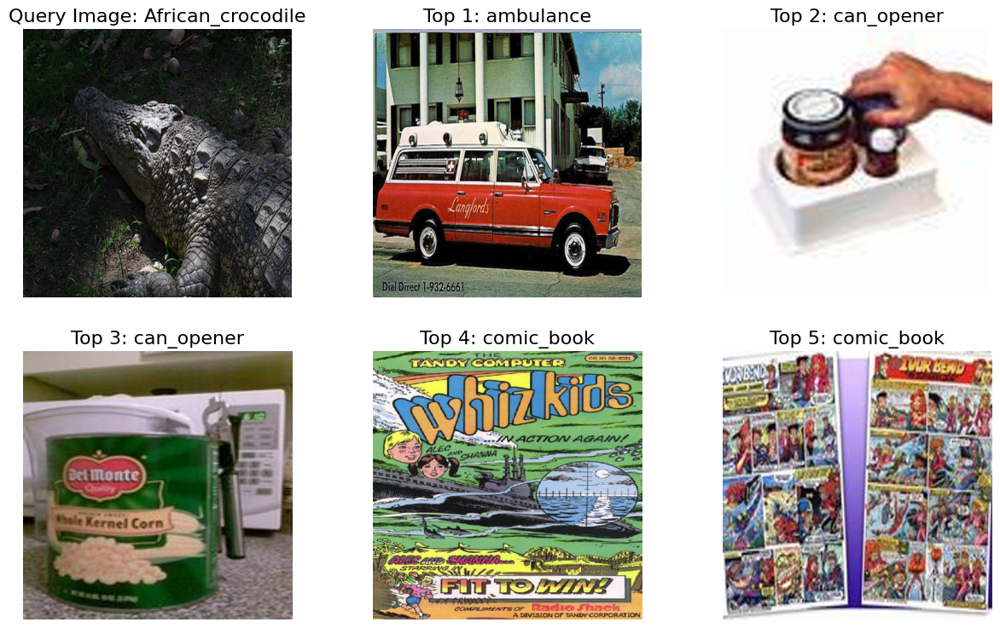

In [28]:

root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_l1_score_clip(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

    

In [29]:
def get_l2_score_clip(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    query_embedding = get_single_image_embedding(query)
    ls_path_score = []

    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAMES:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(path, size)

            embedding_list = []
            for idx_img in range(images_np.shape[0]):
                embedding = get_single_image_embedding(images_np[idx_img].astype(np.uint8))
                embedding_list.append(embedding)

            rates = mean_square_difference(query_embedding, np.stack(embedding_list))
            ls_path_score.extend(list(zip(images_path, rates)))

    return query, ls_path_score

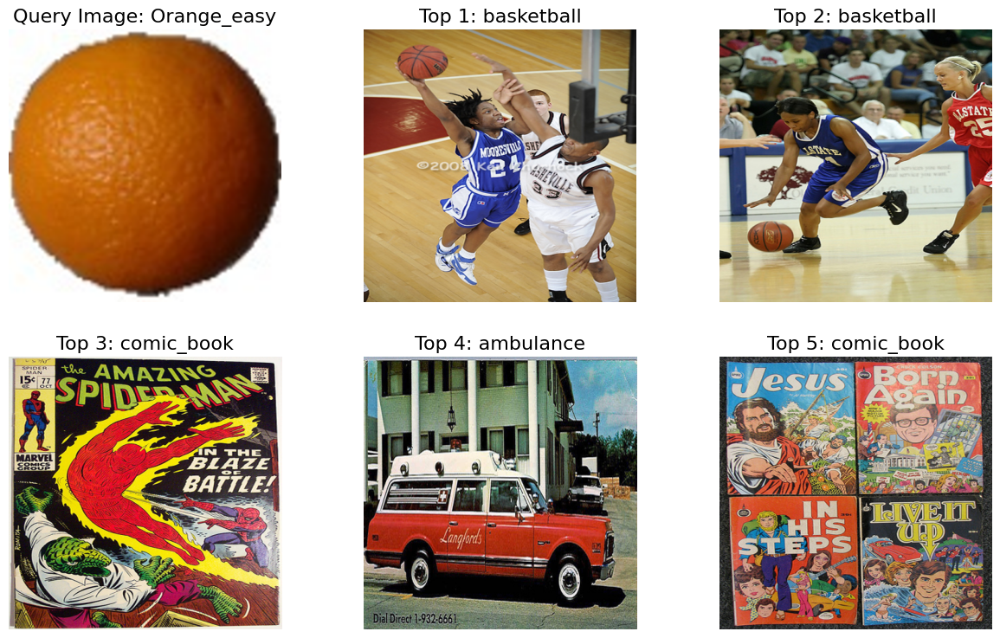

In [30]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_l2_score_clip(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

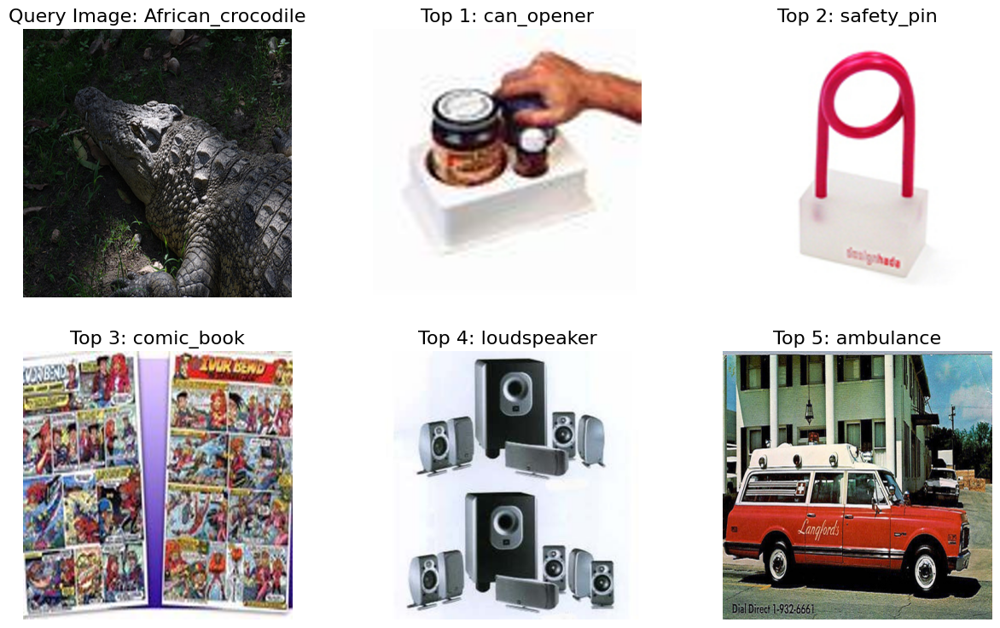

In [31]:

root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_l2_score_clip(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

In [37]:
def get_cosine_simmilarity_score_clip(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    query_embedding = get_single_image_embedding(query)
    ls_path_score = []

    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAMES:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(path, size)
            embedding_list = []
            for idx_img in range(images_np.shape[0]):
                embedding = get_single_image_embedding(images_np[idx_img].astype(np.uint8))
                embedding_list.append(embedding)

            rates = cosine_similarity(query_embedding, np.stack(embedding_list))
            ls_path_score.extend(list(zip(images_path, rates)))

    return query, ls_path_score

In [36]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_cosine_simmilarity_score_clip(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

TypeError: unsupported operand type(s) for ** or pow(): 'list' and 'int'

In [41]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_cosine_simmilarity_score_clip(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

TypeError: unsupported operand type(s) for ** or pow(): 'list' and 'int'

In [40]:
def get_correlation_coefficient_score_clip(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    query_embedding = get_single_image_embedding(query)
    ls_path_score = []

    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAMES:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(path, size)
            embedding_list = []

            for idx_img in range(images_np.shape[0]):
                embedding = get_single_image_embedding(images_np[idx_img].astype(np.uint8))
                embedding_list.append(embedding)

            rates = correlation_coefficient(query_embedding, np.stack(embedding_list))
            ls_path_score.extend(list(zip(images_path, rates)))


    return query, ls_path_score



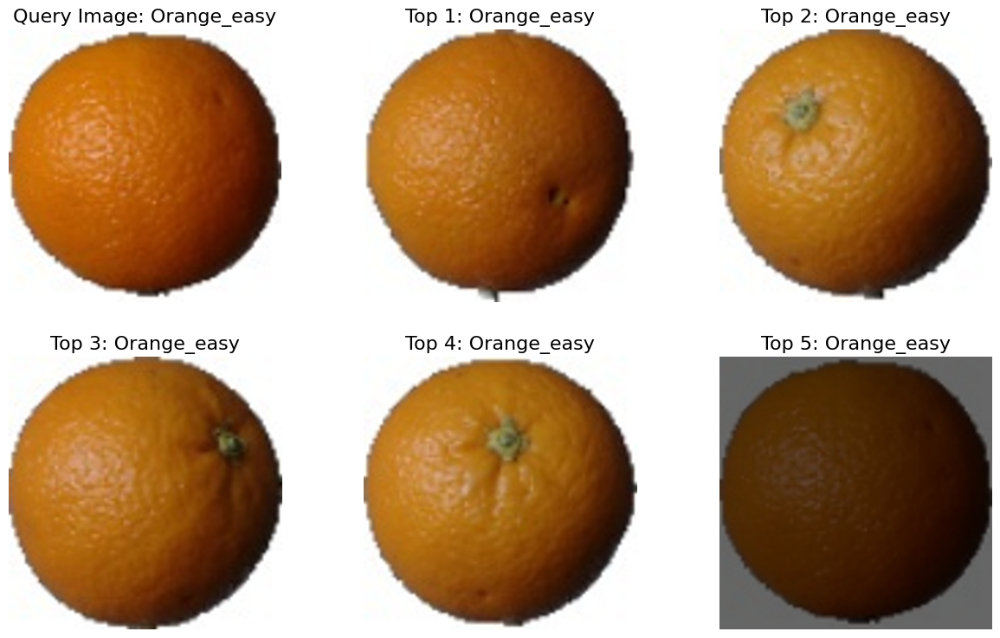

In [ ]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_correlation_coefficient_score_clip(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

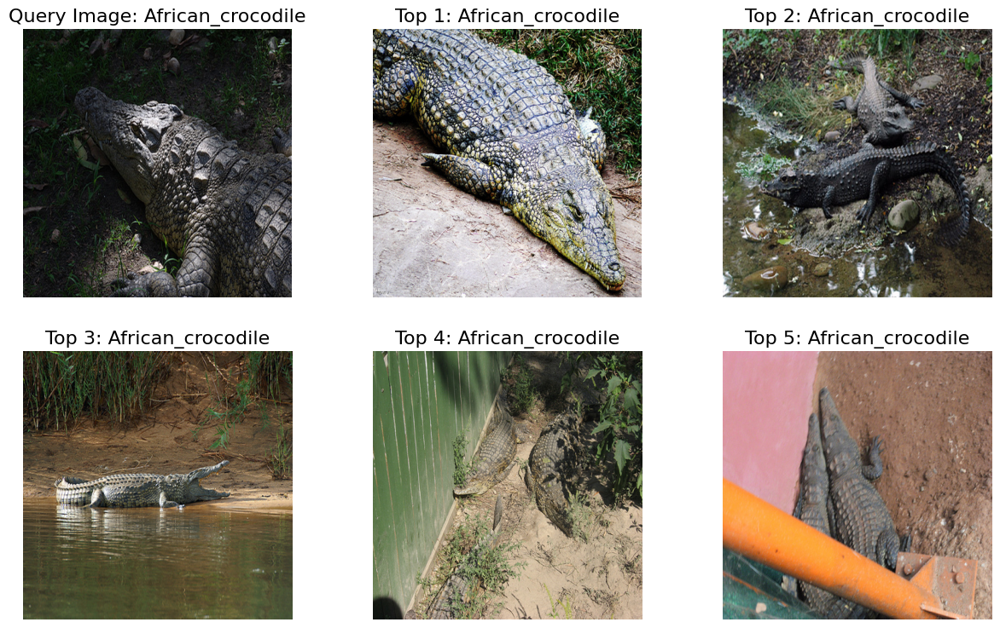

In [ ]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_correlation_coefficient_score_clip(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

# Improving using vector database

In [ ]:
def get_files_path(path):
    files_path = []

    for label in CLASS_NAMES:
        label_path = path + '/' + label
        # print(label_path)
        filenames = os.listdir(label_path)
        # display(filenames)
        for filename in filenames:
            filepath = label_path + '/' + filename
            files_path.append(filepath)


    return files_path

data_path = f"{ROOT}/train"
files_path = get_files_path(path=data_path)


In [ ]:
from tqdm import tqdm

def add_embedding(collection, files_path):
    ids = []
    embeddings = []

    for id_filepath, filepath in tqdm(enumerate(files_path)):
        ids.append(f"id_{id_filepath}")
        image = Image.open(filepath)
        embedding = get_single_image_embedding(image=image)
        embeddings.append(embedding)

    collection.add(embeddings=embeddings, ids=ids)



In [ ]:
import chromadb

# Create a Chroma Client
chroma_client = chromadb.Client()

# Create a collection
l2_collection = chroma_client.get_or_create_collection(
    name='l2_collection',
    metadata={"hnsw:space": "12"}
)
add_embedding(collection=l2_collection, files_path=files_path)

595it [01:02,  9.45it/s]


In [ ]:
def search(image_path, collection, n_results):
    query_image = Image.open(image_path)
    query_embedding = get_single_image_embedding(query_image)
    results = collection.query(
        query_embeddings=[query_embedding],
        n_results=n_results
    )

    return results


In [ ]:


def plot_results_chroma(image_path, files_path, results):
    query_image = Image.open(image_path).resize((448,448))
    images = [query_image]
    class_name = []
    for id_img in results['ids'][0]:
        id_img = int(id_img.split('_')[-1])
        img_path = files_path[id_img]
        img = Image.open(img_path).resize((448,448))
        images.append(img)
        class_name.append(img_path.split('/')[2])

    fig, axes = plt.subplots(2, 3, figsize=(12, 8))

    # Iterate through images and plot them
    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i])
        if i == 0:
            ax.set_title(f"Query Image: {image_path.split('/')[2]}")
        else:
            ax.set_title(f"Top {i+1}: {class_name[i-1]}")
        ax.axis('off')  # Hide axes
    # Display the plot
    plt.show()

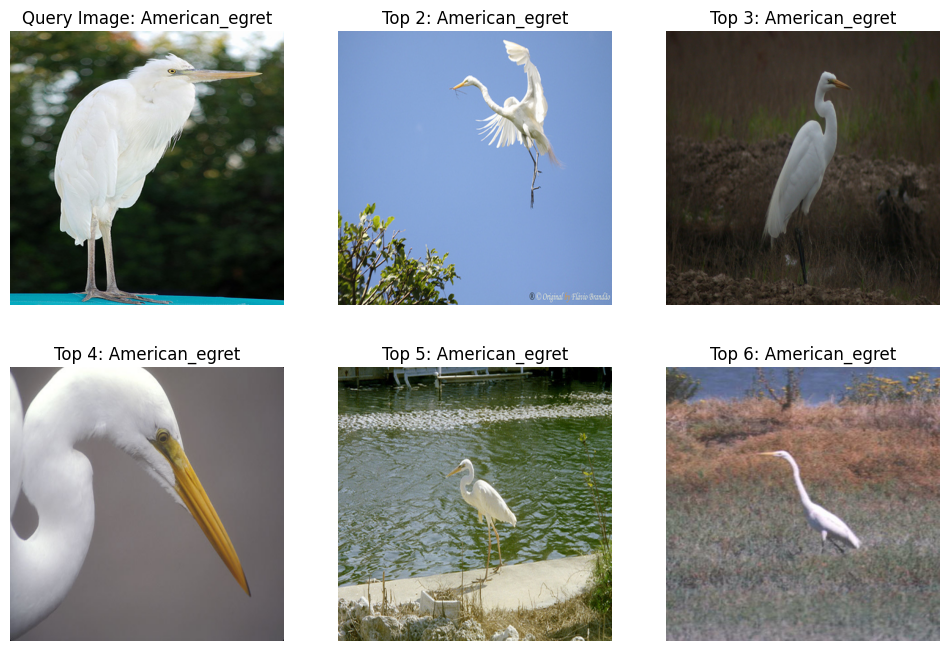

In [ ]:
test_path = f"{ROOT}/test"
test_files_path = get_files_path(path=test_path)
test_path = test_files_path[1]
l2_results = search(image_path=test_path, collection=l2_collection, n_results=5)
plot_results_chroma(image_path=test_path, files_path=files_path, results=l2_results)

# Using cosine similarity and vector db

In [ ]:
# Create a collection
cosine_collection = chroma_client.get_or_create_collection(
    name='cosine_collection',
    metadata={'hnsw:space': 'cosine'}
)
add_embedding(collection=cosine_collection, files_path=files_path)

595it [01:04,  9.19it/s]


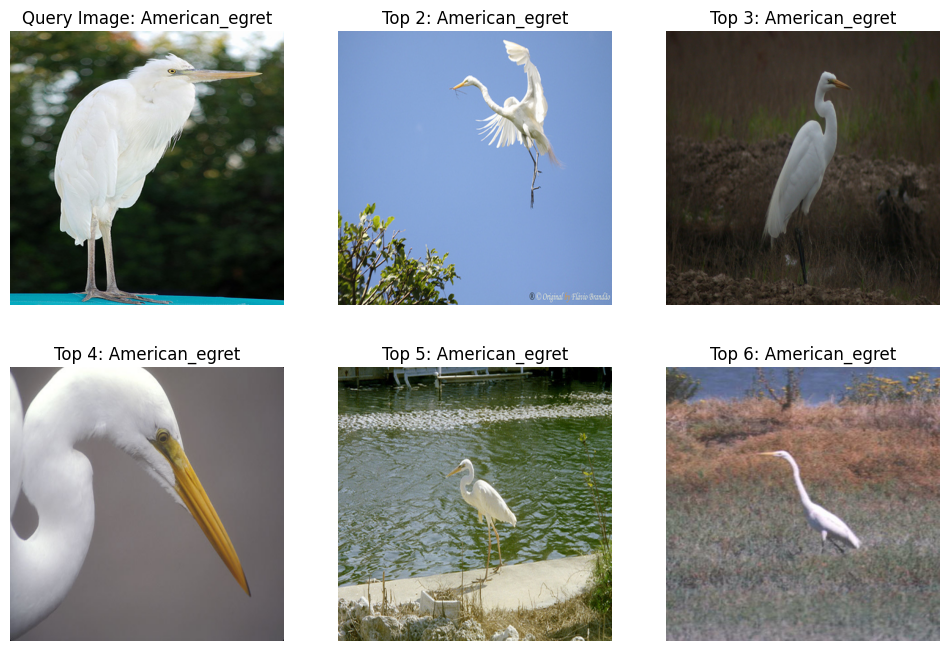

In [ ]:
test_path = f"{ROOT}/test"
test_files_path = get_files_path(path=test_path)
test_path = test_files_path[1]
cosine_results = search(image_path=test_path, collection=cosine_collection, n_results=5)
plot_results_chroma(image_path=test_path, files_path=files_path, results=cosine_results)

In [ ]:
# Multiple choice

# Question 2

a = np.array([1, 2, 3])
b = np.array([4, 5, 6])

l1 = np.sum(np.abs(a-b))
print(l1)

9


In [ ]:
l2 = np.sqrt(np.sum((a-b)**2))
print(l2**2)

27.0


In [ ]:
v1 = np.array([1, 0, 1])
v2 = np.array([1, 1, 0])

dot = v1.dot(v2)
norm1 = np.sqrt(np.sum(v1**2))
norm2 = np.sqrt(np.sum(v2**2))
print(dot/(norm1*norm2))

0.4999999999999999


In [ ]:
v3 = np.array([2, 4])
v4 = np.array([1, 2])

corr = np.corrcoef(v3, v4)
print(corr)

[[1. 1.]
 [1. 1.]]
